## Authors:
   
70662 jmca.coelho@campus.fct.unl.pt

72599 jmp.bernardo@campus.fct.unl.pt   

# ============================
# Task 2
# ============================

In [ ]:
!pip install datasets transformers timm wandb matplotlib albumentations torchmetrics supervision pycocotools

In [ ]:
import os
import numpy as np

# MacOS Users: Uncomment the following line to enable MPS fallback
#os.environ["PYTORCH_MPS_DISABLE"] = "1"

import torch
from PIL import ImageDraw, Image

checkpoint = "PekingU/rtdetr_r18vd"

# Select input image size
image_size = 480

In [ ]:
# Mapping between class IDs and labels

label2id = {
    'Plastic bag & wrapper': 0,
    'Cigarette': 1,
    'Bottle': 2,
    'Bottle cap': 3,
    'Can': 4,
    'Carton': 5}

id2label = {v: k for k, v in label2id.items()}
label2id, id2label
categories = list(id2label.values())

In [ ]:
from transformers import AutoImageProcessor

# Instantiate the image processor
image_processor = AutoImageProcessor.from_pretrained(
    checkpoint,         # The checkpoint of the model we want to finetune
    do_resize=True,     # Resize the images to the expected size
    size={"width": image_size, "height": image_size},
    use_fast=True,      # Use the fast version of the processor
)

In [ ]:
import albumentations as A

train_augmentation_and_transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.RandomBrightnessContrast(p=0.5),
        A.HueSaturationValue(p=0.1),
    ],
    bbox_params=A.BboxParams(
        format="coco",
        label_fields=["category"],
        clip=True,
        min_area=25,        # Discard boxes smaller than 5x5 pixels
        min_visibility=0.1, # Discard boxes if <10% remains after cropping
        filter_invalid_bboxes=True,
        min_width=1,
        min_height=1
    ),
)

validation_transform = A.Compose(
    [A.NoOp()],
    bbox_params=A.BboxParams(
        format="coco",
        label_fields=["category"],
        clip=True,
        min_visibility=0.1, # Discard boxes if <10% remains after cropping
        filter_invalid_bboxes=True,
        min_width=1,
        min_height=1
    ),
)

In [ ]:
#!cp -r "/content/drive/MyDrive/taco" /content/taco

# Then update your dataset paths:
from taco_dataset import TACODETRDetectionDataset

train_dataset = TACODETRDetectionDataset(
    img_folder="/content/taco",
    ann_file="/content/taco/annotations_train.json",
    processor=image_processor,
    transform=train_augmentation_and_transform,
)

validation_dataset = TACODETRDetectionDataset(
    img_folder="/content/taco",
    ann_file="/content/taco/annotations_val.json",
    processor=image_processor,
    transform=validation_transform,
)

test_dataset = TACODETRDetectionDataset(
    img_folder="/content/taco",
    ann_file="/content/taco/annotations_test.json",
    processor=image_processor,
    transform=validation_transform,
)


# Inspect a sample from the training dataset
train_dataset[0]

loading annotations into memory...
Done (t=0.19s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!
loading annotations into memory...
Done (t=0.05s)
creating index...
index created!


{'pixel_values': tensor([[[0.1176, 0.1373, 0.1333,  ..., 0.3333, 0.3059, 0.2784],
          [0.1216, 0.1255, 0.1216,  ..., 0.3098, 0.3059, 0.3294],
          [0.1098, 0.1333, 0.1176,  ..., 0.3176, 0.3216, 0.3255],
          ...,
          [0.4510, 0.4627, 0.4471,  ..., 0.2667, 0.2745, 0.2549],
          [0.4039, 0.4078, 0.4196,  ..., 0.2706, 0.2706, 0.2824],
          [0.4039, 0.4196, 0.4510,  ..., 0.3255, 0.2824, 0.3137]],
 
         [[0.0902, 0.1137, 0.1059,  ..., 0.2039, 0.1725, 0.1451],
          [0.1020, 0.1059, 0.1020,  ..., 0.1843, 0.1765, 0.1961],
          [0.0902, 0.1137, 0.1020,  ..., 0.1961, 0.2000, 0.2039],
          ...,
          [0.3922, 0.4039, 0.3882,  ..., 0.2275, 0.2392, 0.2196],
          [0.3490, 0.3529, 0.3608,  ..., 0.2275, 0.2275, 0.2392],
          [0.3569, 0.3725, 0.4000,  ..., 0.2824, 0.2392, 0.2627]],
 
         [[0.1216, 0.1412, 0.1373,  ..., 0.1961, 0.1647, 0.1412],
          [0.1255, 0.1294, 0.1255,  ..., 0.1725, 0.1686, 0.1922],
          [0.1137, 0.137

Image tensor shape: torch.Size([3, 480, 480])
Boxes shape: (4, 4)
Categories shape: (4,)


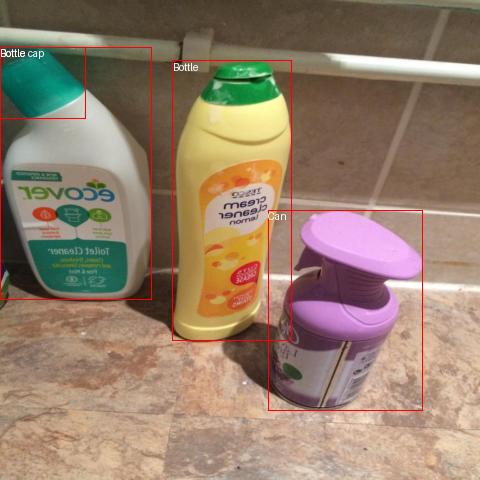

Image tensor shape: torch.Size([3, 480, 480])
Boxes shape: (1, 4)
Categories shape: (1,)


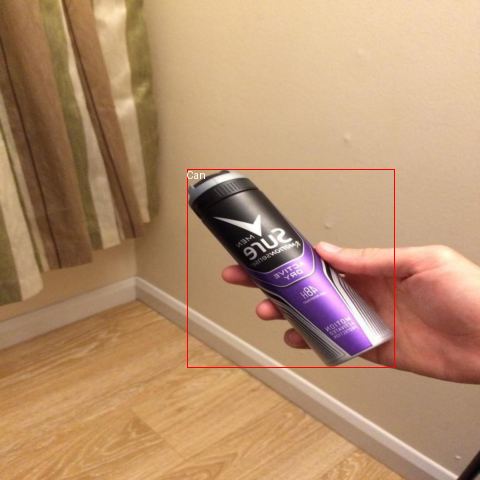

Image tensor shape: torch.Size([3, 480, 480])
Boxes shape: (1, 4)
Categories shape: (1,)


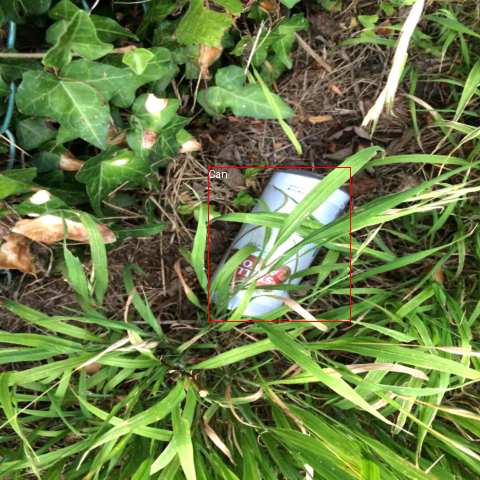

In [ ]:
for i in [15, 16, 17]:
    sample = train_dataset[i]

    # De-normalize image
    image = sample["pixel_values"]
    print("Image tensor shape:", image.shape)
    image = image.numpy().transpose(1, 2, 0)
    image = (image - image.min()) / (image.max() - image.min()) * 255.
    image = Image.fromarray(image.astype(np.uint8))

    # Convert boxes from [center_x, center_y, width, height] to [x, y, width, height] for visualization
    boxes = sample["labels"]["boxes"].numpy()
    print("Boxes shape:", boxes.shape)
    boxes[:, :2] = boxes[:, :2] - boxes[:, 2:] / 2
    w, h = image.size
    boxes = boxes * np.array([w, h, w, h])[None]

    categories = sample["labels"]["class_labels"].numpy()
    print("Categories shape:", categories.shape)

    # Draw boxes and labels on image
    draw = ImageDraw.Draw(image)
    for box, category in zip(boxes, categories):
        x, y, w, h = box
        draw.rectangle([x, y, x + w, y + h], outline="red", width=1)
        draw.text((x, y), id2label[category], fill="white")

    display(image)

In [ ]:
from taco_dataset import taco_detr_collate_fn

import numpy as np
import torch
from dataclasses import dataclass
from transformers.image_transforms import center_to_corners_format
from torchmetrics.detection.mean_ap import MeanAveragePrecision


@dataclass
class ModelOutput:
    logits: torch.Tensor
    pred_boxes: torch.Tensor


class MAPEvaluator:

    def __init__(self, image_processor, threshold=0.00, id2label=None):
        self.image_processor = image_processor
        self.threshold = threshold
        self.id2label = id2label

    def collect_image_sizes(self, targets):
        """Collect image sizes across the dataset as list of tensors with shape [batch_size, 2]."""
        image_sizes = []
        for batch in targets:
            batch_image_sizes = torch.tensor(np.array([x["size"] for x in batch]))
            image_sizes.append(batch_image_sizes)
        return image_sizes

    def collect_targets(self, targets, image_sizes):
        post_processed_targets = []
        for target_batch, image_size_batch in zip(targets, image_sizes):
            for target, size in zip(target_batch, image_size_batch):

                # here we have "yolo" format (x_center, y_center, width, height) in relative coordinates 0..1
                # and we need to convert it to "pascal" format (x_min, y_min, x_max, y_max) in absolute coordinates
                height, width = size
                boxes = torch.tensor(target["boxes"])
                boxes = center_to_corners_format(boxes)
                boxes = boxes * torch.tensor([[width, height, width, height]])

                labels = torch.tensor(target["class_labels"])
                post_processed_targets.append({"boxes": boxes, "labels": labels})
        return post_processed_targets

    def collect_predictions(self, predictions, image_sizes):
        post_processed_predictions = []
        for batch, target_sizes in zip(predictions, image_sizes):
            batch_logits, batch_boxes = batch[1], batch[2]
            output = ModelOutput(logits=torch.tensor(batch_logits), pred_boxes=torch.tensor(batch_boxes))
            post_processed_output = self.image_processor.post_process_object_detection(
                output, threshold=self.threshold, target_sizes=target_sizes
            )
            post_processed_predictions.extend(post_processed_output)
        return post_processed_predictions

    @torch.no_grad()
    def __call__(self, evaluation_results):

        predictions, targets = evaluation_results.predictions, evaluation_results.label_ids

        image_sizes = self.collect_image_sizes(targets)
        post_processed_targets = self.collect_targets(targets, image_sizes)
        post_processed_predictions = self.collect_predictions(predictions, image_sizes)

        evaluator = MeanAveragePrecision(box_format="xyxy", class_metrics=True)
        evaluator.warn_on_many_detections = False
        evaluator.update(post_processed_predictions, post_processed_targets)

        metrics = evaluator.compute()

        # Replace list of per class metrics with separate metric for each class
        classes = metrics.pop("classes")
        map_per_class = metrics.pop("map_per_class")
        mar_100_per_class = metrics.pop("mar_100_per_class")
        for class_id, class_map, class_mar in zip(classes, map_per_class, mar_100_per_class):
            class_name = id2label[class_id.item()] if id2label is not None else class_id.item()
            metrics[f"map_{class_name}"] = class_map
            metrics[f"mar_100_{class_name}"] = class_mar

        metrics = {k: round(v.item(), 4) for k, v in metrics.items()}

        return metrics

eval_compute_metrics_fn = MAPEvaluator(image_processor=image_processor,
                                       threshold=0.01, id2label=id2label)

In [ ]:
from transformers import AutoModelForObjectDetection

model = AutoModelForObjectDetection.from_pretrained(
    checkpoint,
    id2label=id2label,
    label2id=label2id,
    ignore_mismatched_sizes=True,
)

Some weights of RTDetrForObjectDetection were not initialized from the model checkpoint at PekingU/rtdetr_r18vd and are newly initialized because the shapes did not match:
- model.decoder.class_embed.0.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.0.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.decoder.class_embed.1.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.1.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.decoder.class_embed.2.bias: found shape torch.Size([80]) in the checkpoint and torch.Size([6]) in the model instantiated
- model.decoder.class_embed.2.weight: found shape torch.Size([80, 256]) in the checkpoint and torch.Size([6, 256]) in the model instantiated
- model.denoising_

In [ ]:
from transformers import TrainingArguments

training_args = TrainingArguments(
    output_dir="rtdetr-r18-taco",
    num_train_epochs=20,                # Number of training epochs
    max_grad_norm=0.1,                  # Gradient clipping norm
    learning_rate=5e-5,                 # Learning rate
    warmup_steps=300,                   # Number of warmup steps for learning rate scheduler
    per_device_train_batch_size=8,      # Batch size per device during training
    per_device_eval_batch_size=8,
    weight_decay=1e-4,
    dataloader_num_workers=2,           # Number of workers for data loading
    metric_for_best_model="eval_map",   # Metric to use to compare models
    greater_is_better=True,             # Whether a higher metric score is better
    load_best_model_at_end=True,        # Load the best model when finished training
    eval_strategy="epoch",              # Evaluation strategy to use
    save_strategy="epoch",              # Save checkpoint strategy to use
    save_total_limit=2,                 # Maximum number of model checkpoints to save
    bf16=True,                          # Use bf16 precision
    remove_unused_columns=False,        # Whether to remove unused columns in the dataset
    eval_do_concat_batches=False,       # Whether to concatenate batches during evaluation
    report_to="none",                  # Reporting tool to use
)

In [ ]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=validation_dataset,
    processing_class=image_processor,
    data_collator=taco_detr_collate_fn,
    compute_metrics=eval_compute_metrics_fn,
)

trainer.train()

Epoch,Training Loss,Validation Loss,Map,Map 50,Map 75,Map Small,Map Medium,Map Large,Mar 1,Mar 10,Mar 100,Mar Small,Mar Medium,Mar Large,Map Plastic bag & wrapper,Mar 100 Plastic bag & wrapper,Map Cigarette,Mar 100 Cigarette,Map Bottle,Mar 100 Bottle,Map Bottle cap,Mar 100 Bottle cap,Map Can,Mar 100 Can,Map Carton,Mar 100 Carton
1,No log,46.550182,0.006700,0.014600,0.002800,0.007400,0.007500,0.011100,0.041700,0.125900,0.200100,0.104900,0.219600,0.421300,0.007200,0.160800,0.000000,0.014500,0.000200,0.128600,0.000500,0.235100,0.000900,0.225500,0.031200,0.436100
2,No log,15.969147,0.054700,0.072500,0.059900,0.049300,0.049000,0.310600,0.204600,0.349700,0.405500,0.232100,0.435400,0.799700,0.056900,0.384800,0.000100,0.043500,0.068500,0.505700,0.082200,0.418900,0.048700,0.510600,0.071700,0.569400
3,No log,10.647947,0.122900,0.149400,0.135000,0.080500,0.093300,0.464500,0.255900,0.446600,0.551600,0.383200,0.661300,0.847700,0.097400,0.528800,0.000500,0.108100,0.086800,0.690000,0.150000,0.524300,0.177900,0.736200,0.225000,0.722200
4,No log,9.381271,0.132900,0.168800,0.141400,0.064200,0.161000,0.433200,0.289500,0.462200,0.545000,0.385400,0.652200,0.811400,0.077500,0.515200,0.001100,0.159700,0.164800,0.655700,0.137900,0.483800,0.220000,0.727700,0.196300,0.727800
5,37.190900,8.830183,0.194500,0.251200,0.218200,0.096800,0.203600,0.438300,0.318000,0.495400,0.564800,0.403000,0.666000,0.847200,0.137900,0.529600,0.001500,0.138700,0.209100,0.667100,0.166800,0.564900,0.389200,0.746800,0.262800,0.741700
6,37.190900,8.826607,0.195200,0.255300,0.216100,0.105200,0.208600,0.559800,0.298000,0.502700,0.574100,0.434100,0.645300,0.847700,0.164000,0.532000,0.002000,0.180600,0.240800,0.710000,0.191200,0.559500,0.342800,0.759600,0.230500,0.702800
7,37.190900,8.623629,0.191800,0.250500,0.218200,0.103700,0.212800,0.442400,0.300100,0.503800,0.569500,0.436300,0.643200,0.840900,0.153200,0.517600,0.002400,0.146800,0.305800,0.711400,0.117800,0.556800,0.292700,0.778700,0.278900,0.705600
8,37.190900,8.447934,0.223200,0.292000,0.254200,0.114700,0.243000,0.595900,0.317300,0.511600,0.573300,0.440900,0.645400,0.834600,0.153200,0.540000,0.002600,0.187100,0.323700,0.721400,0.186000,0.573000,0.438000,0.748900,0.235700,0.669400
9,37.190900,8.296748,0.213500,0.275000,0.240000,0.107600,0.231900,0.604600,0.315700,0.516500,0.587000,0.458100,0.663500,0.838500,0.192800,0.565600,0.002900,0.196800,0.336800,0.722900,0.162500,0.581100,0.378400,0.763800,0.207800,0.691700
10,11.813700,8.418800,0.222100,0.290500,0.249600,0.122300,0.261400,0.611500,0.306200,0.502200,0.574000,0.444900,0.643700,0.831700,0.177100,0.524800,0.002200,0.204800,0.313200,0.710000,0.186700,0.556800,0.462900,0.761700,0.190200,0.686100


There were missing keys in the checkpoint model loaded: ['class_embed.0.weight', 'class_embed.0.bias', 'class_embed.1.weight', 'class_embed.1.bias', 'class_embed.2.weight', 'class_embed.2.bias', 'bbox_embed.0.layers.0.weight', 'bbox_embed.0.layers.0.bias', 'bbox_embed.0.layers.1.weight', 'bbox_embed.0.layers.1.bias', 'bbox_embed.0.layers.2.weight', 'bbox_embed.0.layers.2.bias', 'bbox_embed.1.layers.0.weight', 'bbox_embed.1.layers.0.bias', 'bbox_embed.1.layers.1.weight', 'bbox_embed.1.layers.1.bias', 'bbox_embed.1.layers.2.weight', 'bbox_embed.1.layers.2.bias', 'bbox_embed.2.layers.0.weight', 'bbox_embed.2.layers.0.bias', 'bbox_embed.2.layers.1.weight', 'bbox_embed.2.layers.1.bias', 'bbox_embed.2.layers.2.weight', 'bbox_embed.2.layers.2.bias'].


TrainOutput(global_step=2000, training_loss=17.1333515625, metrics={'train_runtime': 2384.6532, 'train_samples_per_second': 6.701, 'train_steps_per_second': 0.839, 'total_flos': 1.3306011015168e+18, 'train_loss': 17.1333515625, 'epoch': 20.0})

In [ ]:
test_metrics = trainer.evaluate(test_dataset)
test_metrics

{'eval_loss': 9.074117660522461,
 'eval_map': 0.1931,
 'eval_map_50': 0.2424,
 'eval_map_75': 0.2079,
 'eval_map_small': 0.063,
 'eval_map_medium': 0.2219,
 'eval_map_large': 0.4714,
 'eval_mar_1': 0.3068,
 'eval_mar_10': 0.4785,
 'eval_mar_100': 0.5382,
 'eval_mar_small': 0.4237,
 'eval_mar_medium': 0.6216,
 'eval_mar_large': 0.7749,
 'eval_map_Plastic bag & wrapper': 0.1679,
 'eval_mar_100_Plastic bag & wrapper': 0.4926,
 'eval_map_Cigarette': 0.0189,
 'eval_mar_100_Cigarette': 0.2639,
 'eval_map_Bottle': 0.1992,
 'eval_mar_100_Bottle': 0.6549,
 'eval_map_Bottle cap': 0.1289,
 'eval_mar_100_Bottle cap': 0.4935,
 'eval_map_Can': 0.3753,
 'eval_mar_100_Can': 0.7082,
 'eval_map_Carton': 0.2683,
 'eval_mar_100_Carton': 0.6161,
 'eval_runtime': 11.4816,
 'eval_samples_per_second': 15.503,
 'eval_steps_per_second': 2.003,
 'epoch': 20.0}

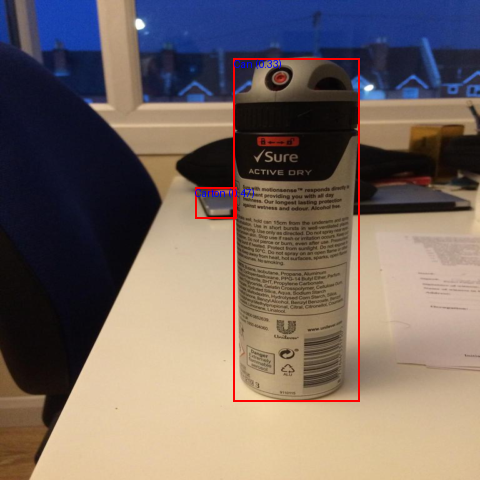

In [ ]:
import torch
from PIL import Image, ImageDraw
import numpy as np

# Pick one test image index (you can change this)
test_index = 1

# Get a batch of size 1 from the test set
batch = taco_detr_collate_fn([test_dataset[test_index]])

# Get model device & dtype
device = next(model.parameters()).device
dtype = next(model.parameters()).dtype

# Prepare inputs for the model: move to same device & dtype
inputs = {
    "pixel_values": batch["pixel_values"].to(device=device, dtype=dtype)
}

model.eval()
with torch.no_grad():
    outputs = model(**inputs)

# We visualise on the *preprocessed* (480x480) image
target_sizes = torch.tensor(
    [(image_size, image_size)], device=model.device
)

result = image_processor.post_process_object_detection(
    outputs,
    threshold=0.3,        # confidence threshold
    target_sizes=target_sizes
)[0]

# De-normalize image back to [0, 255] for drawing
image_tensor = batch["pixel_values"][0].cpu()
image_np = image_tensor.numpy().transpose(1, 2, 0)
image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) * 255.
image = Image.fromarray(image_np.astype("uint8"))

draw = ImageDraw.Draw(image)

for score, label, box in zip(result["scores"], result["labels"], result["boxes"]):
    x1, y1, x2, y2 = [float(v) for v in box]
    cls_name = model.config.id2label[int(label)]
    draw.rectangle((x1, y1, x2, y2), outline="red", width=2)
    draw.text((x1, y1), f"{cls_name} ({score:.2f})", fill="blue")

display(image)


=== Test image 1 (GOOD example) ===


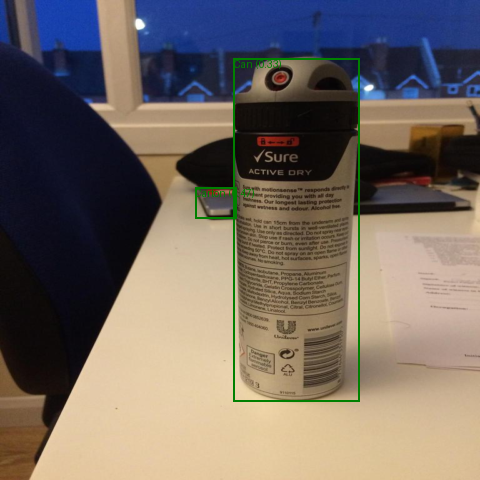


=== Test image 20 (GOOD example) ===


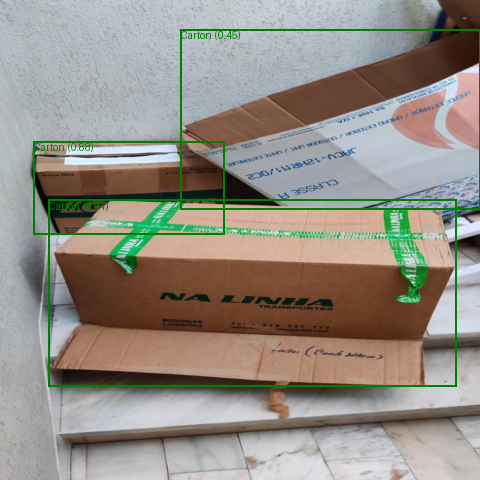


=== Test image 44 (GOOD example) ===


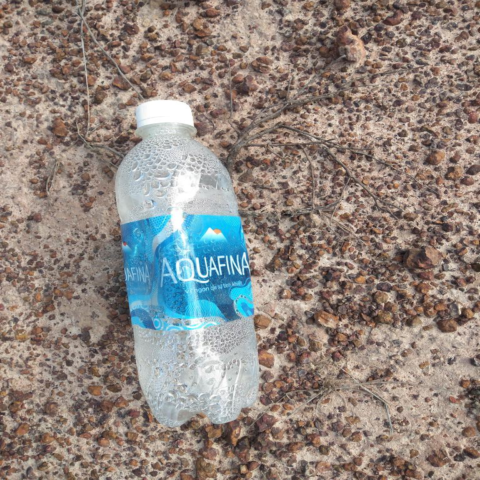

In [ ]:
good_examples = [1, 20, 44]

device = next(model.parameters()).device
dtype = next(model.parameters()).dtype

for idx in good_examples:
    print(f"\n=== Test image {idx} (GOOD example) ===")

    # Get batch with pixel_values + labels
    batch = taco_detr_collate_fn([test_dataset[idx]])

    # Build inputs: ONLY pixel_values, moved to same device & dtype as model
    inputs = {
        "pixel_values": batch["pixel_values"].to(device=device, dtype=dtype)
    }

    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)

    target_sizes = torch.tensor(
        [(image_size, image_size)], device=model.device
    )
    result = image_processor.post_process_object_detection(
        outputs,
        threshold=0.3,
        target_sizes=target_sizes
    )[0]

    image_tensor = batch["pixel_values"][0].cpu()
    image_np = image_tensor.numpy().transpose(1, 2, 0)
    image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) * 255.
    image = Image.fromarray(image_np.astype("uint8"))

    draw = ImageDraw.Draw(image)

    for score, label, box in zip(result["scores"], result["labels"], result["boxes"]):
        x1, y1, x2, y2 = [float(v) for v in box]
        cls_name = model.config.id2label[int(label)]
        draw.rectangle((x1, y1, x2, y2), outline="green", width=2)
        draw.text((x1, y1), f"{cls_name} ({score:.2f})", fill="green")

    display(image)


=== Test image 11 (FAILURE example) ===


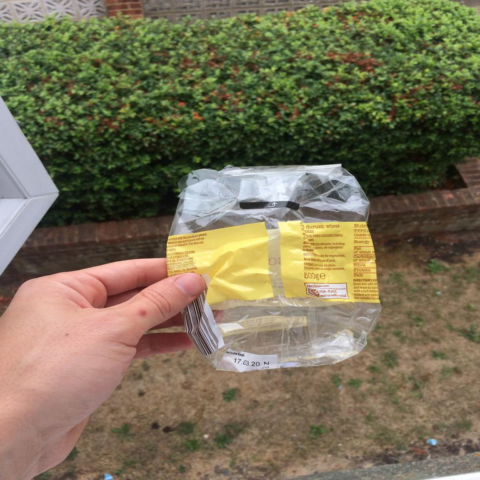


=== Test image 53 (FAILURE example) ===


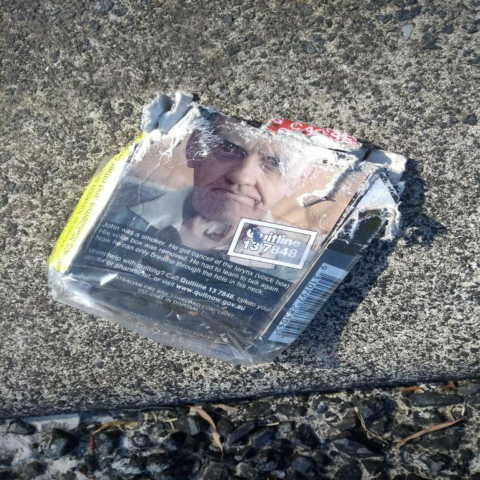


=== Test image 57 (FAILURE example) ===


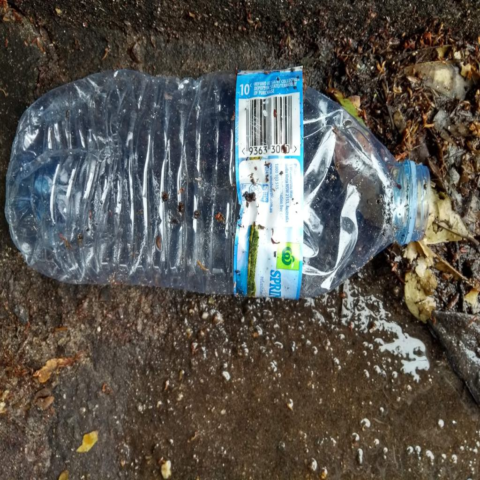

In [ ]:
failure_examples = [11, 53, 57]  # replace with indices where you see clear failures

for idx in failure_examples:
    print(f"\n=== Test image {idx} (FAILURE example) ===")

    batch = taco_detr_collate_fn([test_dataset[idx]])

    # Build inputs: ONLY pixel_values, moved to same device & dtype as model
    inputs = {
        "pixel_values": batch["pixel_values"].to(device=device, dtype=dtype)
    }

    model.eval()
    with torch.no_grad():
        outputs = model(**inputs)

    target_sizes = torch.tensor(
        [(image_size, image_size)], device=model.device
    )
    result = image_processor.post_process_object_detection(
        outputs,
        threshold=0.3,
        target_sizes=target_sizes
    )[0]

    image_tensor = batch["pixel_values"][0].cpu()
    image_np = image_tensor.numpy().transpose(1, 2, 0)
    image_np = (image_np - image_np.min()) / (image_np.max() - image_np.min()) * 255.
    image = Image.fromarray(image_np.astype("uint8"))

    draw = ImageDraw.Draw(image)

    # Draw predictions
    for score, label, box in zip(result["scores"], result["labels"], result["boxes"]):
        x1, y1, x2, y2 = [float(v) for v in box]
        cls_name = model.config.id2label[int(label)]
        draw.rectangle((x1, y1, x2, y2), outline="red", width=2)
        draw.text((x1, y1), f"{cls_name} ({score:.2f})", fill="red")

    display(image)

# ============================
# Task 3 – UAVVaste: Aerial Images
# ============================

In [213]:
# Path where you saved the fine-tuned RT-DETR model from Task 2.3
# Example (adapt to your path in Drive):
taco_checkpoint_dir = "/content/rtdetr-r18-taco/checkpoint-2000"

In [214]:
from transformers import AutoImageProcessor, AutoModelForObjectDetection

image_processor = AutoImageProcessor.from_pretrained(
    taco_checkpoint_dir,
    use_fast=True,
)

model = AutoModelForObjectDetection.from_pretrained(
    taco_checkpoint_dir,
)
model.to(device)
model.eval()

model.config.id2label  # just to confirm your TACO classes

{0: 'Plastic bag & wrapper',
 1: 'Cigarette',
 2: 'Bottle',
 3: 'Bottle cap',
 4: 'Can',
 5: 'Carton'}

In [215]:
#!cp -r "/content/drive/MyDrive/UAVWasteDataset_subset" /content/UAVWasteDataset_subset

In [218]:
import os, glob, random

uav_root = "/content/UAVWasteDataset_subset"

# No "images/" folder — search directly inside uav_root
image_paths = sorted(
    glob.glob(os.path.join(uav_root, "*.jpg"))
    + glob.glob(os.path.join(uav_root, "*.jpeg"))
    + glob.glob(os.path.join(uav_root, "*.JPG"))
    + glob.glob(os.path.join(uav_root, "*.png"))
)

print("Num UAVVaste images:", len(image_paths))
image_paths[:10]

Num UAVVaste images: 40


['/content/UAVWasteDataset_subset/BATCH_d06_img_1050.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d06_img_130.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d06_img_2500.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d06_img_2940.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d06_img_380.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d07_img_1160.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d07_img_580.jpg',
 '/content/UAVWasteDataset_subset/BATCH_d07_img_720.jpg',
 '/content/UAVWasteDataset_subset/BATCH_s03_img_1100.jpg',
 '/content/UAVWasteDataset_subset/BATCH_s03_img_840.jpg']

In [219]:
def run_inference_and_plot(image_path, threshold=0.3):
    # Load image
    image = Image.open(image_path).convert("RGB")
    orig_w, orig_h = image.size

    # Preprocess
    inputs = image_processor(images=image, return_tensors="pt")
    inputs = {k: v.to(device) for k, v in inputs.items()}

    # Inference
    with torch.no_grad():
        outputs = model(**inputs)

    # Post-process to original image size
    target_sizes = torch.tensor([[orig_h, orig_w]], device=device)
    results = image_processor.post_process_object_detection(
        outputs, threshold=threshold, target_sizes=target_sizes
    )[0]

    # Draw predictions
    vis_image = image.copy()
    draw = ImageDraw.Draw(vis_image)

    for score, label, box in zip(results["scores"], results["labels"], results["boxes"]):
        x1, y1, x2, y2 = [float(v) for v in box]
        cls_name = model.config.id2label[int(label)]
        draw.rectangle((x1, y1, x2, y2), outline="red", width=2)
        draw.text((x1, y1), f"{cls_name} ({score:.2f})", fill="red")

    plt.figure(figsize=(7, 7))
    plt.imshow(vis_image)
    plt.axis("off")
    plt.title(os.path.basename(image_path))
    plt.show()

Image: /content/UAVWasteDataset_subset/batch_s02_img_13.jpg


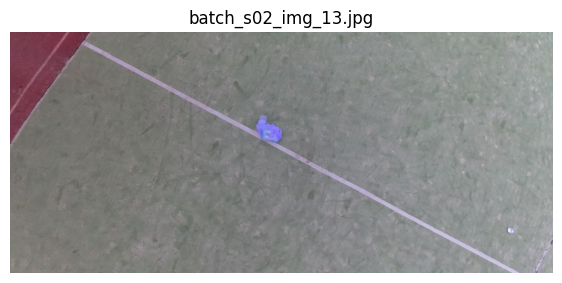

Image: /content/UAVWasteDataset_subset/batch_04_img_140.jpg


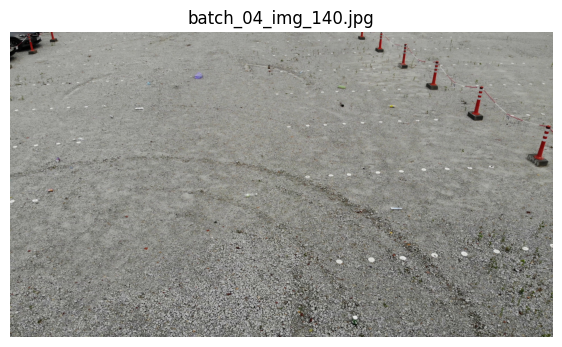

Image: /content/UAVWasteDataset_subset/BATCH_s05_img_9400.jpg


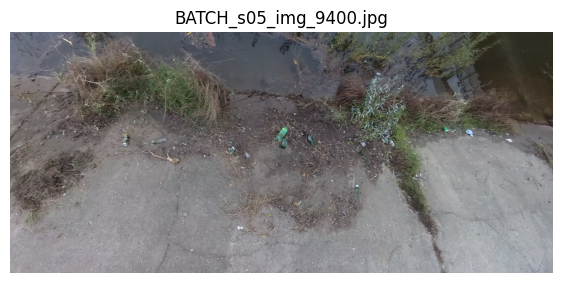

Image: /content/UAVWasteDataset_subset/batch_04_img_2780.jpg


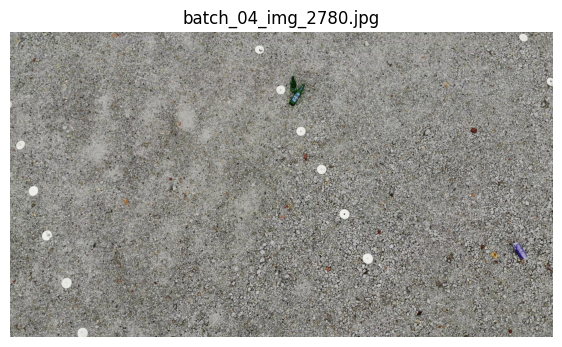

Image: /content/UAVWasteDataset_subset/batch_01_frame_11.jpg


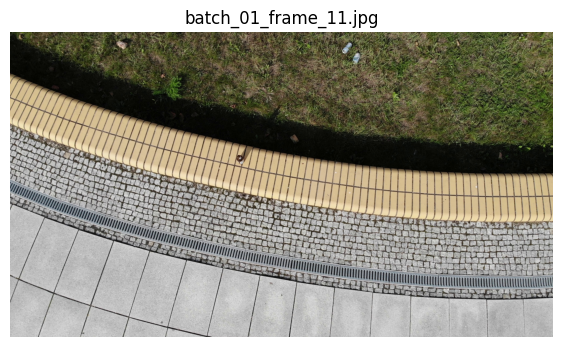

Image: /content/UAVWasteDataset_subset/BATCH_d06_img_1050.jpg


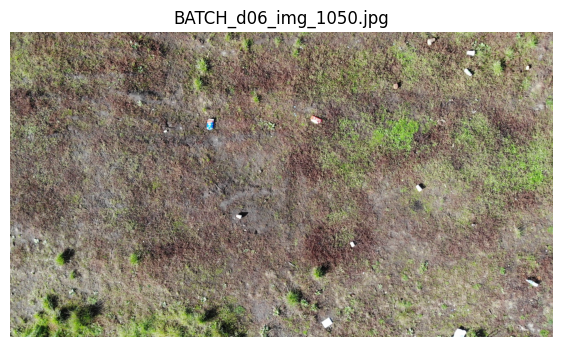

Image: /content/UAVWasteDataset_subset/BATCH_s04_img_5900.jpg


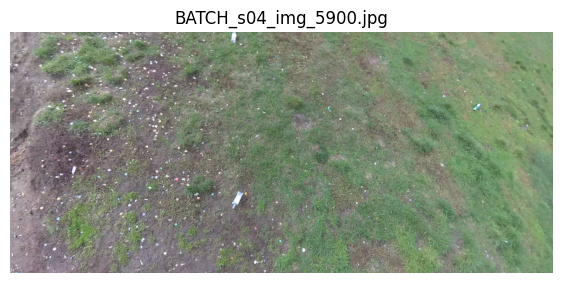

Image: /content/UAVWasteDataset_subset/batch_04_img_1940.jpg


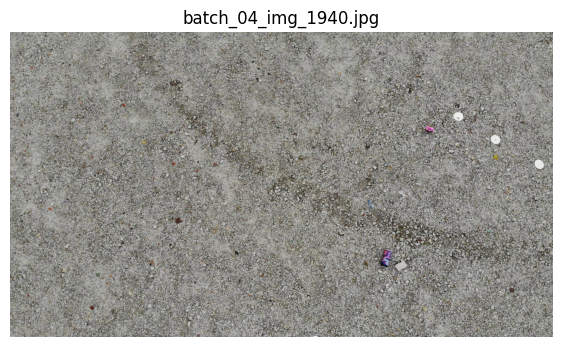

Image: /content/UAVWasteDataset_subset/batch_02_img_1140.jpg


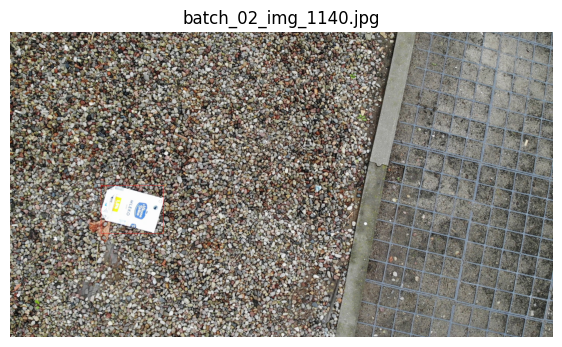

Image: /content/UAVWasteDataset_subset/BATCH_s03_img_1100.jpg


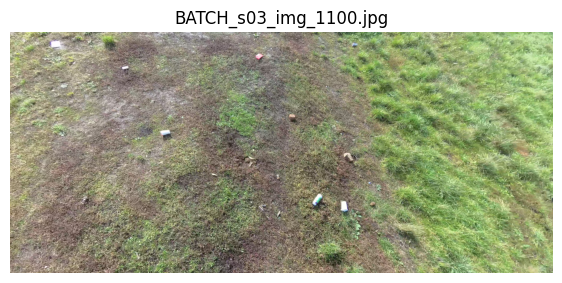

In [225]:
import matplotlib.pyplot as plt
# Option A: pick specific indices by hand
#sample_indices = [0, 3, 7, 12, 18, 23, 28, 32, 35, 39]
#sample_paths = [image_paths[i] for i in sample_indices]

# Option B: choose randomly
#
sample_paths = random.sample(image_paths, k=10)

for p in sample_paths:
    print("Image:", p)
    run_inference_and_plot(p, threshold=0.3)

=== GOOD example (image index 3) ===


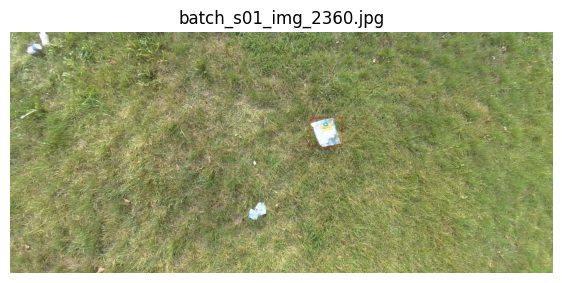

=== FAILURE example (image index 20) ===


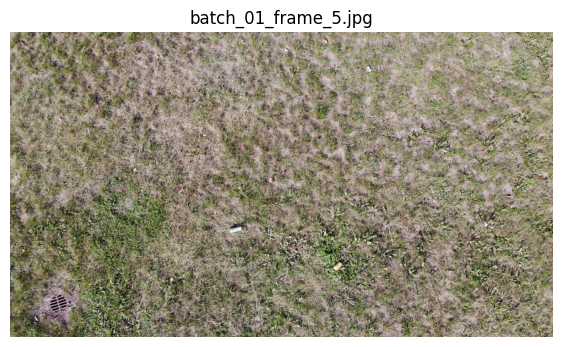

In [224]:
print("=== GOOD example (image index 3) ===")
run_inference_and_plot(image_paths[31])

print("=== FAILURE example (image index 20) ===")
run_inference_and_plot(image_paths[20])